In [ ]:
import glob

from potoo.plot import *
from potoo.util import *
import sklearn

from cache import *
from datasets import *
from features import *
from load import *
from sp14.model import *
from util import *
from viz import *

figsize('inline_short');

In [ ]:
recs_paths = load_recs_paths()
display(
    df_summary(recs_paths),
    recs_paths.groupby('dataset').head(2),
    recs_paths.dataset.value_counts(),
)

,dataset,path
dtype,object,object
sizeof,5.8 MiB,5.2 MiB
len,51858,51858
count,51858,51858
nunique,7,51858
mean,NaN,NaN
std,NaN,NaN
min,birdclef-2015,birdclef-2015/organized/wav/00000-2015-amazon.wav
25%,birdclef-2015,birdclef-2015/organized/wav/13023-2014-amazon.wav
50%,birdclef-2015,birdclef-2015/organized/wav/25998-2015-amazon.wav


,dataset,path
0,recordings,recordings/081845.wav
1,recordings,"recordings/ACWO,NOFL,SPTO spotted towhee, acorn woodpecker, flicker.wav"
98,peterson-field-guide,peterson-field-guide/amecro/audio/43215281 Caw (clear).mp3
99,peterson-field-guide,peterson-field-guide/amecro/audio/43215291 Caw (clear).mp3
633,birdclef-2015,birdclef-2015/organized/wav/00000-2015-amazon.wav
634,birdclef-2015,birdclef-2015/organized/wav/00001-2014-amazon.wav
33836,warblrb10k,dcase-2018/warblrb10k_public_wav/000e088a-69f7-4d7a-ba7b.wav
33837,warblrb10k,dcase-2018/warblrb10k_public_wav/0011e7f9-ec1e-4f3a-a70f.wav
41836,ff1010bird,dcase-2018/ff1010bird_wav/100.wav
41837,ff1010bird,dcase-2018/ff1010bird_wav/100180.wav


birdclef-2015           33203
warblrb10k               8000
ff1010bird               7690
nips4b                   1687
mlsp-2013                 645
peterson-field-guide      535
recordings                 98
Name: dataset, dtype: int64

In [ ]:
recs = load_recs_data(
    (recs_paths
        .groupby('dataset')
        .apply(lambda g: (g
            .pipe(sklearn.utils.shuffle, random_state=0)
            .head({  # For faster dev
                # WARNING: This blew up ram last time
                # 'recordings': 500,
                # 'peterson-field-guide': 500,
                # 'mlsp-2013': 645,
            }.get(g.name, 100))  # WARNING: 100 is pretty heavy
            # }.get(g.name, 50))
        ))
        .reset_index(drop=True)
    ),
    # FIXME pickling AudioSegment's across processes makes this (1) slow and (2) super-linearly slow
    #   - TODO We want 'processes' par for converting audio to std .wav format and 'threads' par for loading from std
    #     .wav, so split the convert (metadata_only=True) + load (metadata_only=False) steps to separate these concerns
    # metadata_only=True, dask_opts=dict(scheduler='processes'),
    metadata_only=False, dask_opts=dict(scheduler='threads'),
)
display(
    df_summary(recs),
    recs.groupby('dataset').head(2),
    recs.dataset.value_counts(),
)

[                                                                                          ] | 0% Completed |  0.0s

[                                                                                          ] | 0% Completed |  0.1s

[#######                                                                                   ] | 8% Completed |  0.2s

[##############                                                                            ] | 16% Completed |  0.3s

[#####################                                                                     ] | 24% Completed |  0.4s

[#####################                                                                     ] | 24% Completed |  0.6s

[######################                                                                    ] | 25% Completed |  0.8s

[#########################                                                                 ] | 28% Completed |  0.9s

[#########################                                                                 ] | 28% Completed |  1.1s

[#########################                                                                 ] | 28% Completed |  1.2s

[############################                                                              ] | 32% Completed |  1.3s

[####################################                                                      ] | 40% Completed |  1.4s

[#############################################                                             ] | 50% Completed |  1.5s

[######################################################                                    ] | 60% Completed |  1.7s

[############################################################                              ] | 67% Completed |  1.8s

[###############################################################                           ] | 71% Completed |  1.9s

[#####################################################################                     ] | 77% Completed |  2.0s

[#######################################################################                   ] | 79% Completed |  2.2s

[########################################################################                  ] | 80% Completed |  2.3s

[################################################################################          ] | 89% Completed |  2.4s

[##########################################################################################] | 100% Completed |  2.5s

,dataset,species,species_longhand,species_com_name,species_query,basename,name,duration_s,samples_mb,samples_n,samples,audio
dtype,object,category,category,category,object,object,object,float64,float64,int64,object,object
sizeof,66.0 KiB,47.1 KiB,55.2 KiB,50.4 KiB,33.0 KiB,59.3 KiB,79.0 KiB,27.3 KiB,27.3 KiB,30.0 KiB,679.4 MiB,32.7 KiB
len,698,698,698,698,698,698,698,698,698,698,698,698
count,698,698,698,698,298,698,698,698,698,698,698,698
nunique,7.0,60.0,60.0,60.0,88.0,698.0,698.0,366.0,366.0,366.0,NaN,NaN
mean,NaN,NaN,NaN,NaN,NaN,NaN,NaN,23.141,0.973,510266.557,NaN,NaN
std,NaN,NaN,NaN,NaN,NaN,NaN,NaN,34.852,1.466,768483.274,NaN,NaN
min,birdclef-2015,SCQU,Scaled Quail - SCQU,Scaled Quail,BEWR,00349-2014-amazon,birdclef-2015/organized/wav/00349-2014-amazon,1.03,0.043,22784,NaN,NaN
25%,ff1010bird,_UNK,Unknown - _UNK,Unknown,_NON,32809-2015-amazon,dcase-2018/ff1010bird_wav/56957,10.00,0.421,220500,NaN,NaN
50%,nips4b,_UNK,Unknown - _UNK,Unknown,_UNK,81e96b2c-341a-4927-9b2d,mlsp-2013/mlsp_contest_dataset/essential_data/src_wavs/PC17_20100804_070020_0020,10.00,0.421,220753,NaN,NaN


,dataset,species,species_longhand,species_com_name,species_query,basename,name,duration_s,samples_mb,samples_n,samples,audio
491,peterson-field-guide,SCQU,Scaled Quail - SCQU,Scaled Quail,scaqua,43186581 Song (Screech),peterson-field-guide/scaqua/audio/43186581 Song (Screech),20.80,0.877,459648,[-1 0 1 ... 0 0 0],"peterson-field-guide/scaqua/audio/43186581 Song (Screech): 1 channels, 16 bit, sampled @ 22.05 kHz, 20.846s long"
441,peterson-field-guide,MONQ,Montezuma Quail - MONQ,Montezuma Quail,monqua,43186901 Burrt & wing sounds,peterson-field-guide/monqua/audio/43186901 Burrt & wing sounds,9.04,0.380,199296,[ 0 -1 -1 ... -1 0 0],"peterson-field-guide/monqua/audio/43186901 Burrt & wing sounds: 1 channels, 16 bit, sampled @ 22.05 kHz, 9.038s long"
547,recordings,OSPR,Osprey - OSPR,Osprey,OSPR,OSPR osprey- very noisy- fault day,recordings/OSPR osprey- very noisy- fault day,89.60,3.770,1976504,[-462 -380 -215 ... -42 -51 -39],"recordings/OSPR osprey- very noisy- fault day: 1 channels, 16 bit, sampled @ 22.05 kHz, 89.637s long"
541,recordings,RTHA,Red-tailed Hawk - RTHA,Red-tailed Hawk,RTHA,"RTHA red tailed hawk, noise","recordings/RTHA red tailed hawk, noise",42.10,1.770,928934,[ 254 233 166 ... 3649 3287 3876],"recordings/RTHA red tailed hawk, noise: 1 channels, 16 bit, sampled @ 22.05 kHz, 42.129s long"
241,mlsp-2013,CONI,Common Nighthawk - CONI,Common Nighthawk,CONI,PC4_20100804_050000_0020,mlsp-2013/mlsp_contest_dataset/essential_data/src_wavs/PC4_20100804_050000_0020,10.00,0.421,220500,[26 3 -5 ... 12 15 -1],"mlsp-2013/mlsp_contest_dataset/essential_data/src_wavs/PC4_20100804_050000_0020: 1 channels, 16 bit, sampled @ 22.05 kHz, 10.000s long"
201,mlsp-2013,CONI,Common Nighthawk - CONI,Common Nighthawk,CONI,PC5_20090804_050000_0040,mlsp-2013/mlsp_contest_dataset/essential_data/src_wavs/PC5_20090804_050000_0040,10.00,0.421,220500,[130 118 85 ... -33 -56 -36],"mlsp-2013/mlsp_contest_dataset/essential_data/src_wavs/PC5_20090804_050000_0040: 1 channels, 16 bit, sampled @ 22.05 kHz, 10.000s long"
362,nips4b,_UNK,Unknown - _UNK,Unknown,None,nips4b_birds_testfile0054,nips4b/all_wav/nips4b_birds_testfile0054,5.00,0.210,110336,[-27 -45 45 ... 94 200 71],"nips4b/all_wav/nips4b_birds_testfile0054: 1 channels, 16 bit, sampled @ 22.05 kHz, 5.004s long"
373,nips4b,_UNK,Unknown - _UNK,Unknown,None,nips4b_birds_trainfile658,nips4b/all_wav/nips4b_birds_trainfile658,5.00,0.210,110336,[ 1 -24 -36 ... 2 14 -3],"nips4b/all_wav/nips4b_birds_trainfile658: 1 channels, 16 bit, sampled @ 22.05 kHz, 5.004s long"
0,birdclef-2015,_UNK,Unknown - _UNK,Unknown,None,02358-2014-amazon,birdclef-2015/organized/wav/02358-2014-amazon,6.04,0.254,133182,[ -458 -2425 -2445 ... 40 20 -8],"birdclef-2015/organized/wav/02358-2014-amazon: 1 channels, 16 bit, sampled @ 22.05 kHz, 6.040s long"
642,warblrb10k,_UNK,Unknown - _UNK,Unknown,None,0868bb70-6537-4aa1-860c,dcase-2018/warblrb10k_public_wav/0868bb70-6537-4aa1-860c,10.10,0.423,221696,[ -1 -1 0 ... 733 775 899],"dcase-2018/warblrb10k_public_wav/0868bb70-6537-4aa1-860c: 1 channels, 16 bit, sampled @ 22.05 kHz, 10.054s long"


warblrb10k              100
nips4b                  100
peterson-field-guide    100
ff1010bird              100
mlsp-2013               100
birdclef-2015           100
recordings               98
Name: dataset, dtype: int64

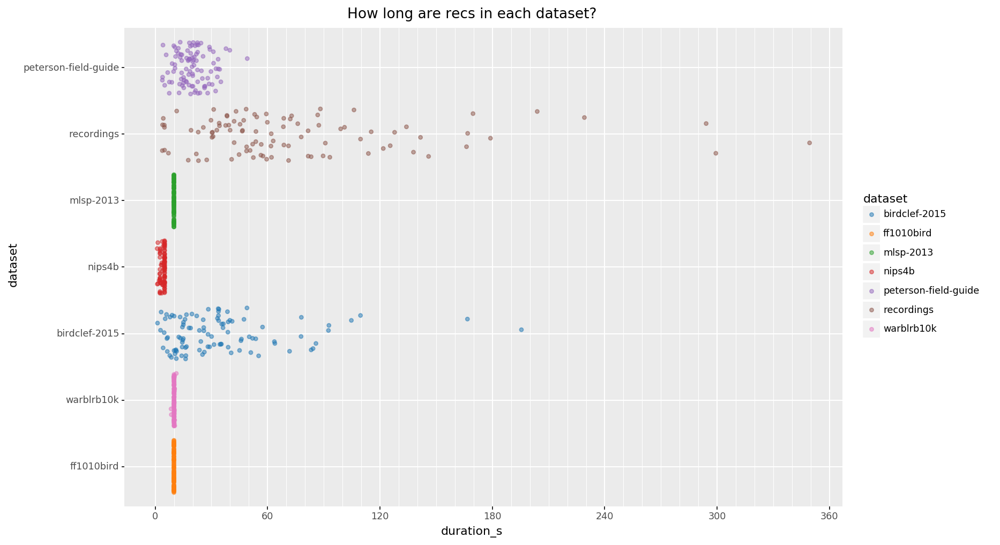

<ggplot: (339871720)>

In [ ]:
(recs
    .pipe(ggplot)
    + geom_jitter(aes(x='duration_s', y='dataset', color='dataset'), alpha=.5)
    + scale_y_discrete(limits=list(reversed(recs.dataset.unique())))
    + scale_color_cmap_d(mpl.cm.tab10)
    + scale_x_continuous(
        breaks=lambda lims: np.arange((lims[0] // 60 + 1) * 60, lims[1], 60),
        minor_breaks=lambda lims: np.arange((lims[0] // 60 + 1) * 60, lims[1], 10),
    )
    + theme_figsize('inline')
    + ggtitle('How long are recs in each dataset?')
)

In [ ]:
# Compute spectros
model = Model(verbose_config=False)
recs['spectro'] = model.spectros(recs)

________________________________________________________________________________
[Memory] Calling sp14.model._spectros_cache_block...
_spectros_cache_block(<class 'sp14.model.Model'>, [ Recording(dataset='birdclef-2015', species='_UNK', species_longhand='Unknown - _UNK', species_com_name='Unknown', species_query=None, basename='00349-2014-amazon', name='birdclef-2015/organized/wav/00349-2014-amazon', duration_s=15.029297052154195, samples_mb=0.6320877075195312, samples_n=331396, samples=array([-11, ...,   0], dtype=int16), audio=birdclef-2015/organized/wav/00349-2014-amazon: 1 channels, 16 bit, sampled @ 22.05 kHz, 15.029s long),
  Recording(dataset='birdclef-2015', species='_UNK', species_longhand='Unknown - _UNK', species_com_name='Unknown', species_query=None, basename='00628-2014-amazon', name='birdclef-2015/organized/wav/00628-2014-amazon', duration_s=18.064126984126..., sample_rate=22050, f_min=1000, f_bins=40, hop_length=256, frame_length=512, frame_window='hann', __cache_versio

Persisting in /Users/danb/hack/bubo/data/cache/joblib/sp14/model/_spectros_cache_block/618130cf8ee0eec1638f3b19a5940dce


/Users/danb/hack/bubo/features/cache.py:107: UserWarning: Persisting input arguments took 0.60s to run.
If this happens often in your code, it can cause performance problems 
(results will be correct in all cases). 
The reason for this is probably some large input arguments for a wrapped
 function (e.g. large strings).
THIS IS A JOBLIB ISSUE. If you can, kindly provide the joblib's team with an
 example so that they can fix the problem.
  return cache_func(*args, **kwargs)


_____________________________________________spectros_cache_block - 9.0s, 0.2min


________________________________________________________________________________
[Memory] Calling sp14.model._spectros_cache_block...
_spectros_cache_block(<class 'sp14.model.Model'>, [ Recording(dataset='ff1010bird', species='_UNK', species_longhand='Unknown - _UNK', species_com_name='Unknown', species_query=None, basename='101412', name='dcase-2018/ff1010bird_wav/101412', duration_s=10.0, samples_mb=0.42057037353515625, samples_n=220500, samples=array([ -793, ..., -1255], dtype=int16), audio=dcase-2018/ff1010bird_wav/101412: 1 channels, 16 bit, sampled @ 22.05 kHz, 10.000s long),
  Recording(dataset='ff1010bird', species='_UNK', species_longhand='Unknown - _UNK', species_com_name='Unknown', species_query=None, basename='103375', name='dcase-2018/ff1010bird_wav/103375', duration_s=10.0, samples_mb=0.42057037353515625, samples_n=220500, samples=array([-7817, ..., -1417], ..., sample_rate=22050, f_min=1000, f_bins=40, hop_length=256, frame_length=512, frame_window='hann', __cache_versio

Persisting in /Users/danb/hack/bubo/data/cache/joblib/sp14/model/_spectros_cache_block/5c3572b1c199eed2297d84084f17bdda


_____________________________________________spectros_cache_block - 2.3s, 0.0min


________________________________________________________________________________
[Memory] Calling sp14.model._spectros_cache_block...
_spectros_cache_block(<class 'sp14.model.Model'>, [ Recording(dataset='mlsp-2013', species='_NON', species_longhand='No species - _NON', species_com_name='No species', species_query='_NON', basename='PC10_20090513_054500_0020', name='mlsp-2013/mlsp_contest_dataset/essential_data/src_wavs/PC10_20090513_054500_0020', duration_s=10.0, samples_mb=0.42057037353515625, samples_n=220500, samples=array([90, ..., 85], dtype=int16), audio=mlsp-2013/mlsp_contest_dataset/essential_data/src_wavs/PC10_20090513_054500_0020: 1 channels, 16 bit, sampled @ 22.05 kHz, 10.000s long),
  Recording(dataset='mlsp-2013', species='_UNK', species_longhand='Unknown - _UNK', species_com_name='Unknown', species_query='_UNK', basename='PC10_20090606_054500_0010', name='m..., sample_rate=22050, f_min=1000, f_bins=40, hop_length=256, frame_length=512, frame_window='hann', __cache_versio

Persisting in /Users/danb/hack/bubo/data/cache/joblib/sp14/model/_spectros_cache_block/561dd4ff27e3c67f626b7c71ce4c6d63


_____________________________________________spectros_cache_block - 2.2s, 0.0min


________________________________________________________________________________
[Memory] Calling sp14.model._spectros_cache_block...
_spectros_cache_block(<class 'sp14.model.Model'>, [ Recording(dataset='nips4b', species='_UNK', species_longhand='Unknown - _UNK', species_com_name='Unknown', species_query=None, basename='nips4b_birds_testfile0007', name='nips4b/all_wav/nips4b_birds_testfile0007', duration_s=5.00390022675737, samples_mb=0.21044921875, samples_n=110336, samples=array([ 29, ..., -86], dtype=int16), audio=nips4b/all_wav/nips4b_birds_testfile0007: 1 channels, 16 bit, sampled @ 22.05 kHz, 5.004s long),
  Recording(dataset='nips4b', species='_UNK', species_longhand='Unknown - _UNK', species_com_name='Unknown', species_query=None, basename='nips4b_birds_testfile0015', name='nips4b/all_wav/nips4b_birds_testfile0015', duration_s=5.00390022675737, samples_mb=0.21044..., sample_rate=22050, f_min=1000, f_bins=40, hop_length=256, frame_length=512, frame_window='hann', __cache_versio

Persisting in /Users/danb/hack/bubo/data/cache/joblib/sp14/model/_spectros_cache_block/5ea4affce0e162d58fe9c62ce47c8b11


_____________________________________________spectros_cache_block - 1.0s, 0.0min


________________________________________________________________________________
[Memory] Calling sp14.model._spectros_cache_block...
_spectros_cache_block(<class 'sp14.model.Model'>, [ Recording(dataset='peterson-field-guide', species='AMCR', species_longhand='American Crow - AMCR', species_com_name='American Crow', species_query='amecro', basename='43215291 Caw (clear)', name='peterson-field-guide/amecro/audio/43215291 Caw (clear)', duration_s=13.662040816326531, samples_mb=0.5745849609375, samples_n=301248, samples=array([0, ..., 0], dtype=int16), audio=peterson-field-guide/amecro/audio/43215291 Caw (clear): 1 channels, 16 bit, sampled @ 22.05 kHz, 13.662s long),
  Recording(dataset='peterson-field-guide', species='AMCR', species_longhand='American Crow - AMCR', species_com_name='American Crow', species_query='amecro', basename='43215401 Gurgle Phrases', name='peterson..., sample_rate=22050, f_min=1000, f_bins=40, hop_length=256, frame_length=512, frame_window='hann', __cache_versio

Persisting in /Users/danb/hack/bubo/data/cache/joblib/sp14/model/_spectros_cache_block/d33b83921bcaa1f7068078260622afef


_____________________________________________spectros_cache_block - 4.7s, 0.1min


________________________________________________________________________________
[Memory] Calling sp14.model._spectros_cache_block...
_spectros_cache_block(<class 'sp14.model.Model'>, [ Recording(dataset='recordings', species='_UNK', species_longhand='Unknown - _UNK', species_com_name='Unknown', species_query='_UNK', basename='081845', name='recordings/081845', duration_s=4.940045351473923, samples_mb=0.207763671875, samples_n=108928, samples=array([-249, ..., -248], dtype=int16), audio=recordings/081845: 1 channels, 16 bit, sampled @ 22.05 kHz, 4.940s long),
  Recording(dataset='recordings', species='_UNK', species_longhand='Unknown - _UNK', species_com_name='Unknown', species_query='_UNK', basename='ACWO,NOFL,SPTO spotted towhee, acorn woodpecker, flicker', name='recordings/ACWO,NOFL,SPTO spotted towhee, acorn woodpecker, flicker', duration_s=166.1926984126984, samples_..., sample_rate=22050, f_min=1000, f_bins=40, hop_length=256, frame_length=512, frame_window='hann', __cache_versio

Persisting in /Users/danb/hack/bubo/data/cache/joblib/sp14/model/_spectros_cache_block/9f305d9c7ff0770a1a5dc6094c97776e


/Users/danb/hack/bubo/features/cache.py:107: UserWarning: Persisting input arguments took 1.31s to run.
If this happens often in your code, it can cause performance problems 
(results will be correct in all cases). 
The reason for this is probably some large input arguments for a wrapped
 function (e.g. large strings).
THIS IS A JOBLIB ISSUE. If you can, kindly provide the joblib's team with an
 example so that they can fix the problem.
  return cache_func(*args, **kwargs)


____________________________________________spectros_cache_block - 18.7s, 0.3min


________________________________________________________________________________
[Memory] Calling sp14.model._spectros_cache_block...
_spectros_cache_block(<class 'sp14.model.Model'>, [ Recording(dataset='warblrb10k', species='_UNK', species_longhand='Unknown - _UNK', species_com_name='Unknown', species_query=None, basename='01504dc6-8e69-4a67-a357', name='dcase-2018/warblrb10k_public_wav/01504dc6-8e69-4a67-a357', duration_s=10.031020408163265, samples_mb=0.421875, samples_n=221184, samples=array([-1, ..., 50], dtype=int16), audio=dcase-2018/warblrb10k_public_wav/01504dc6-8e69-4a67-a357: 1 channels, 16 bit, sampled @ 22.05 kHz, 10.031s long),
  Recording(dataset='warblrb10k', species='_UNK', species_longhand='Unknown - _UNK', species_com_name='Unknown', species_query=None, basename='016c7028-2512-4cc4-a387', name='dcase-2018/warblrb10k_public_wav/016c7028-2512-4cc4-a387',..., sample_rate=22050, f_min=1000, f_bins=40, hop_length=256, frame_length=512, frame_window='hann', __cache_versio

Persisting in /Users/danb/hack/bubo/data/cache/joblib/sp14/model/_spectros_cache_block/84d4f9f5e4adf96d32611c8db1e0b97b


_____________________________________________spectros_cache_block - 2.4s, 0.0min


In [ ]:
df_summary(recs)

,dataset,species,species_longhand,species_com_name,species_query,basename,name,duration_s,samples_mb,samples_n,samples,audio,spectro
dtype,object,category,category,category,object,object,object,float64,float64,int64,object,object,object
sizeof,85.0 KiB,57.4 KiB,86.5 KiB,67.2 KiB,35.5 KiB,59.8 KiB,80.1 KiB,27.3 KiB,27.3 KiB,30.0 KiB,679.4 MiB,32.7 KiB,32.7 KiB
len,698,698,698,698,698,698,698,698,698,698,698,698,698
count,698,698,698,698,298,698,698,698,698,698,698,698,698
nunique,7.0,60.0,60.0,60.0,88.0,698.0,698.0,366.0,366.0,366.0,NaN,NaN,698.0
mean,NaN,NaN,NaN,NaN,NaN,NaN,NaN,23.141,0.973,510266.557,NaN,NaN,NaN
std,NaN,NaN,NaN,NaN,NaN,NaN,NaN,34.852,1.466,768483.274,NaN,NaN,NaN
min,birdclef-2015,SCQU,Scaled Quail - SCQU,Scaled Quail,BEWR,00349-2014-amazon,birdclef-2015/organized/wav/00349-2014-amazon,1.03,0.043,22784,NaN,NaN,NaN
25%,ff1010bird,_UNK,Unknown - _UNK,Unknown,_NON,32809-2015-amazon,dcase-2018/ff1010bird_wav/56957,10.00,0.421,220500,NaN,NaN,NaN
50%,nips4b,_UNK,Unknown - _UNK,Unknown,_UNK,81e96b2c-341a-4927-9b2d,mlsp-2013/mlsp_contest_dataset/essential_data/src_wavs/PC17_20100804_070020_0020,10.00,0.421,220753,NaN,NaN,NaN


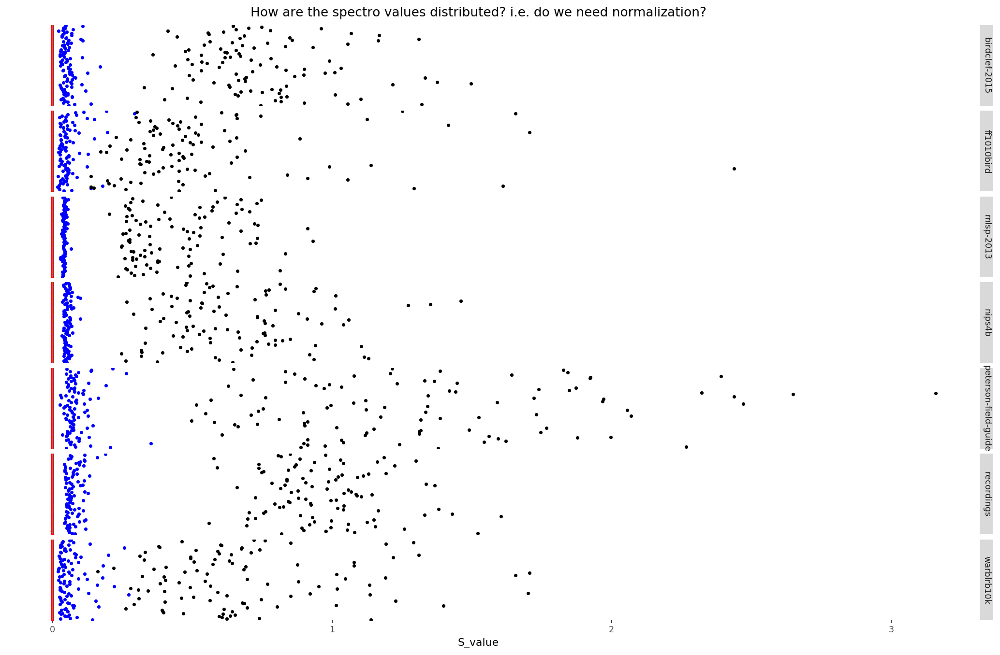

CPU times: user 45.2 s, sys: 13.9 s, total: 59.1 s
Wall time: 27 s


'<ggplot: (336672232)>'

In [ ]:
%%time
repr(recs
    # [lambda df: df.dataset.isin(['recordings', 'peterson-field-guide'])]
    .groupby('dataset').apply(lambda g: (g
        .pipe(sklearn.utils.shuffle, random_state=0)
        # .head(2)  # 2s
        # .head(12)  # 4s
        # .head(25)  # 7s
        # .head(50)  # 12s
        # .head(100)  # 25s
        .head(None)  # 25s
    ))
    .assign(S_values=lambda df: df.spectro.map(lambda spectro: spectro.S.flatten()))
    .assign(S_min=lambda df: df.S_values.map(lambda S_values: S_values.min()))
    .assign(S_max=lambda df: df.S_values.map(lambda S_values: S_values.max()))
    .assign(S_25p=lambda df: df.S_values.map(lambda S_values: np.percentile(S_values, 25)))
    .assign(S_50p=lambda df: df.S_values.map(lambda S_values: np.percentile(S_values, 50)))
    .assign(S_75p=lambda df: df.S_values.map(lambda S_values: np.percentile(S_values, 75)))
    .assign(y=lambda df: df.basename.str.slice(0, 30))
    # Categorical types + facets show all cat values across all facets, which isn't what I want here (but maybe somewhere else)
    # .assign(y=lambda df: df.y.astype(pd.api.types.CategoricalDtype(categories=df.sort_values('S_50p').y.unique(), ordered=True)))
    # Instead, hack the y labels to string sort
    .assign(y=lambda df: df.apply(axis=1, func=lambda row: '[%020.6f] %s' % (row.S_50p, row.y)))
    .pipe(ggplot, aes(y='y'))
    + geom_point(aes(x='S_min'), shape='.', size=1, stroke=1, color='black')
    + geom_point(aes(x='S_25p'), shape='.', size=1, stroke=1, color='blue')
    + geom_point(aes(x='S_50p'), shape='.', size=1, stroke=1, color='red')
    + geom_point(aes(x='S_75p'), shape='.', size=1, stroke=1, color='blue')
    + geom_point(aes(x='S_max'), shape='.', size=1, stroke=1, color='black')
    + facet_grid('dataset ~ .', scales='free_y')
    + geom_vline(xintercept=0, color='gray')
    + xlab('S_value')
    + ylab('')
    + theme(axis_text_y=element_blank())
    + theme(axis_ticks_major_y=element_blank())
    # + theme_figsize(aspect_ratio=1/8)
    + theme_figsize(width=18, aspect_ratio=2/3/8)
    # + theme_figsize(width=24, aspect_ratio=2/3/8)
    + ggtitle('How are the spectro values distributed? i.e. do we need normalization?')
)

In [ ]:
recs.dataset.value_counts()

warblrb10k              100
nips4b                  100
peterson-field-guide    100
ff1010bird              100
mlsp-2013               100
birdclef-2015           100
recordings               98
Name: dataset, dtype: int64

cat_Ss.shape[(4018, 5168)]


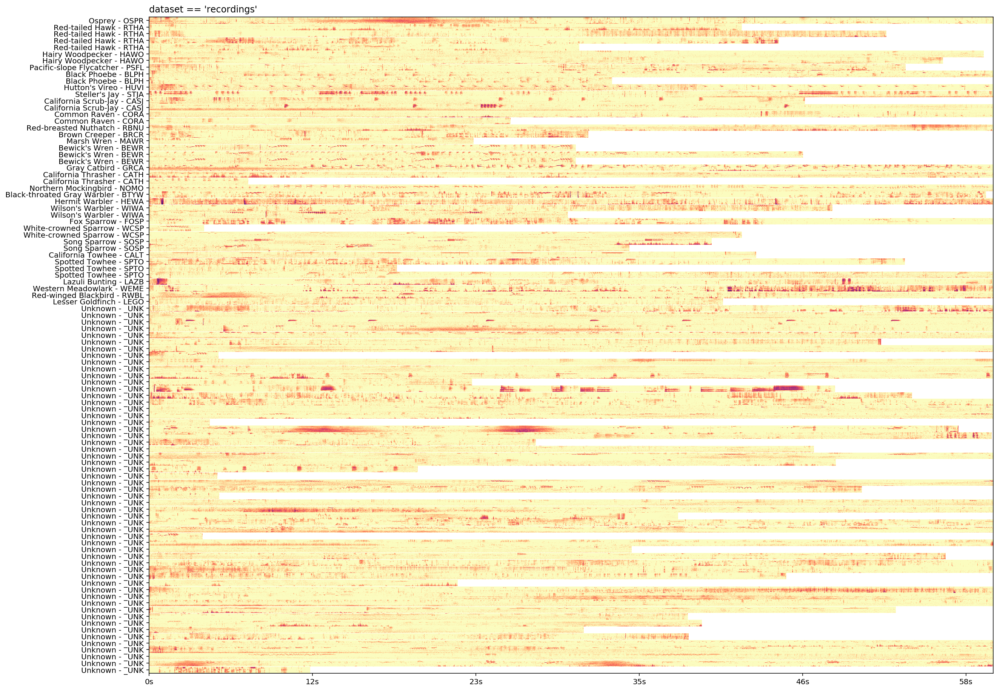

In [ ]:
with with_figsize('full'):
    plot_many_spectros(recs, "dataset == 'recordings'")

cat_Ss.shape[(4100, 5168)]


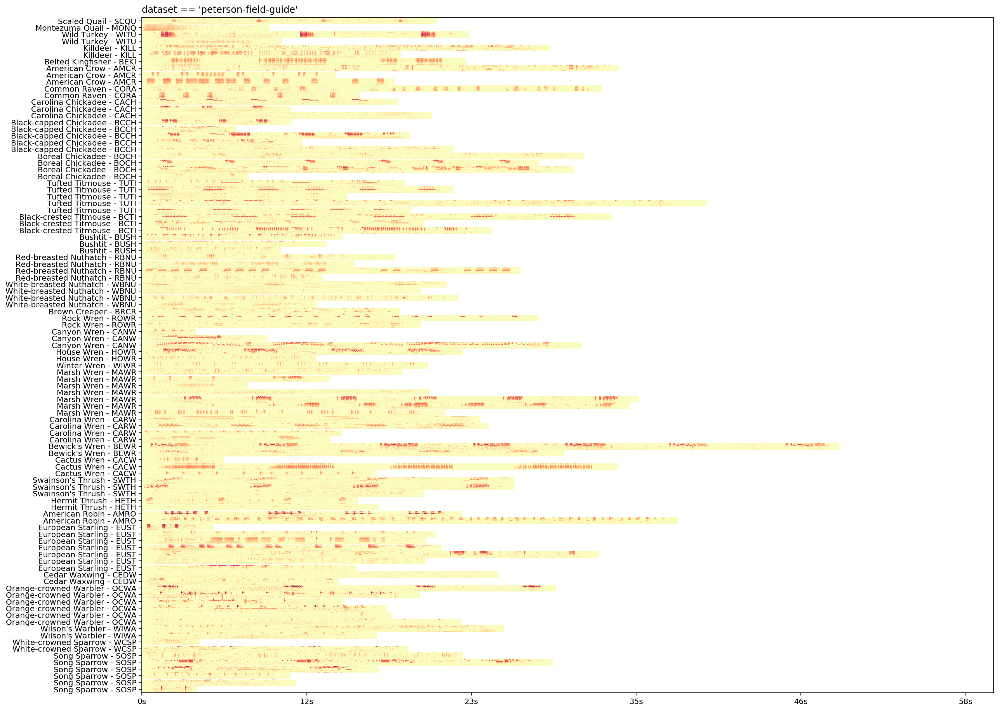

In [ ]:
with with_figsize('full'):
    plot_many_spectros(recs, "dataset == 'peterson-field-guide'")

cat_Ss.shape[(4100, 5168)]


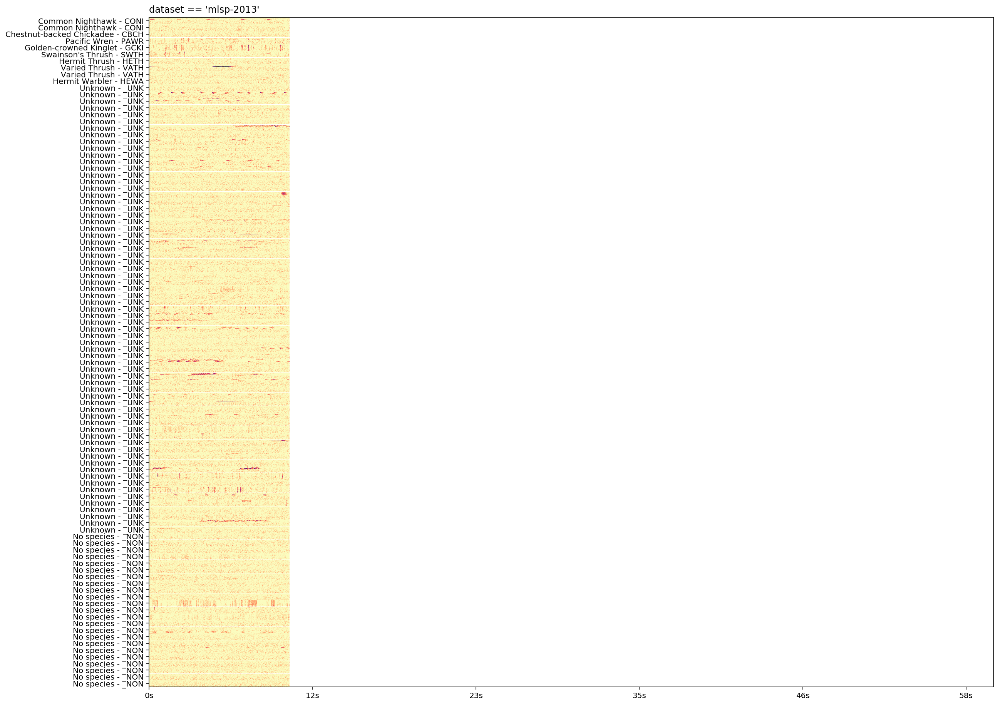

In [ ]:
with with_figsize('full'):
    plot_many_spectros(recs, "dataset == 'mlsp-2013'")

cat_Ss.shape[(4100, 5168)]


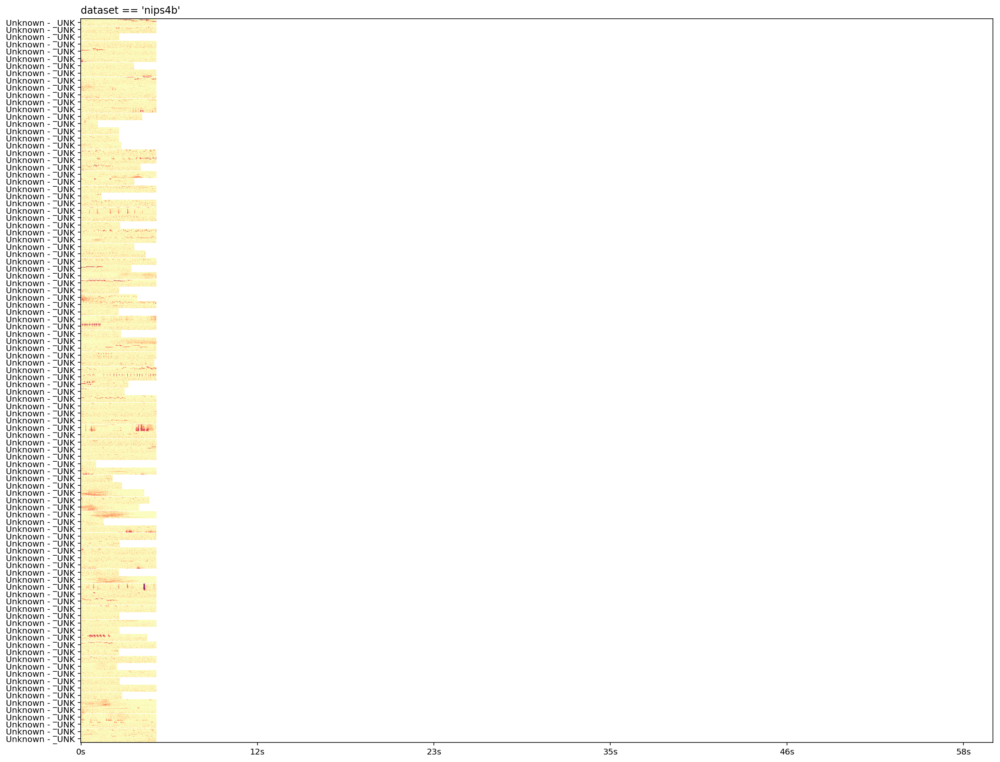

In [ ]:
with with_figsize('full'):
    plot_many_spectros(recs, "dataset == 'nips4b'")

cat_Ss.shape[(4100, 5168)]


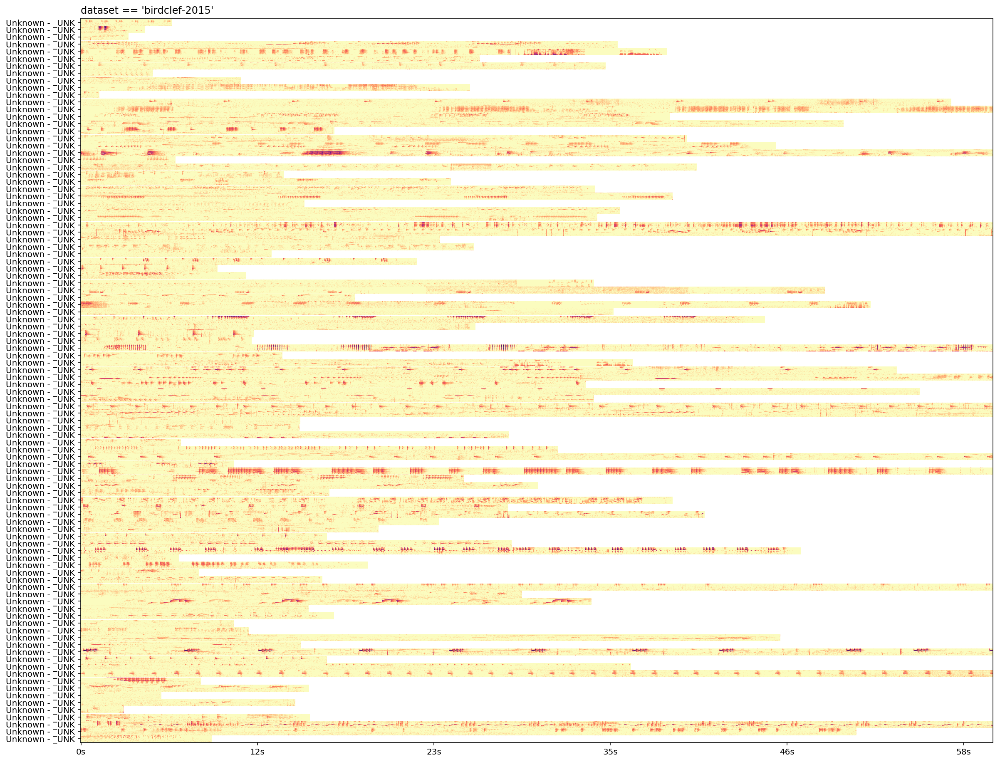

In [ ]:
with with_figsize('full'):
    plot_many_spectros(recs, "dataset == 'birdclef-2015'")

cat_Ss.shape[(4100, 5168)]


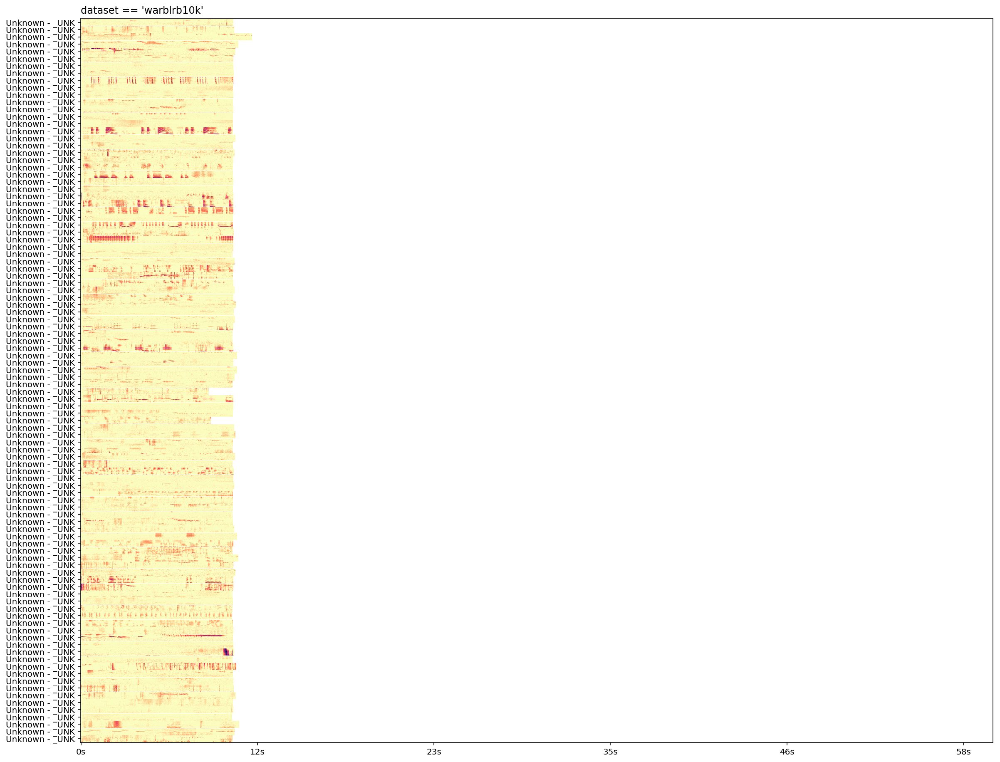

In [ ]:
with with_figsize('full'):
    plot_many_spectros(recs, "dataset == 'warblrb10k'")

cat_Ss.shape[(4100, 5168)]


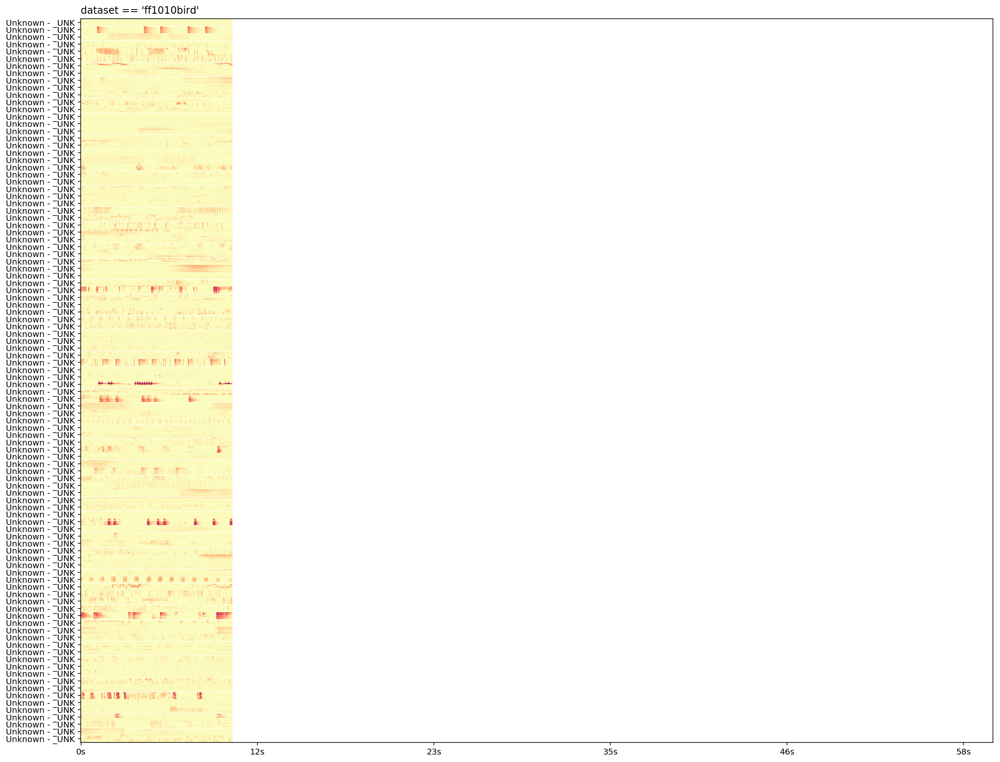

In [ ]:
with with_figsize('full'):
    plot_many_spectros(recs, "dataset == 'ff1010bird'")